#Setup Libarary and Data Collection


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [6]:
# from google.colab import drive
# drive.mount('/content/drive')

In [7]:
df = pd.read_csv("dataset/Penggunaan listrik rumahan.csv", sep=';', header=0)

In [8]:
df.head()

,index,Tanggal,Waktu,Global_active_power (Watt),Global_reactive_power(Kvar),Voltage,Global_intensity
0,0,01/01/2007,00:00:00,258.0,136.0,24197.0,106.0
1,1,01/01/2007,00:01:00,2552.0,1.0,24175.0,104.0
2,2,01/01/2007,00:02:00,255.0,1.0,24164.0,104.0
3,3,01/01/2007,00:03:00,255.0,1.0,24171.0,104.0
4,4,01/01/2007,00:04:00,2554.0,1.0,24198.0,104.0


In [9]:
df.drop(columns=['index'], inplace=True)
df.head()

,Tanggal,Waktu,Global_active_power (Watt),Global_reactive_power(Kvar),Voltage,Global_intensity
0,01/01/2007,00:00:00,258.0,136.0,24197.0,106.0
1,01/01/2007,00:01:00,2552.0,1.0,24175.0,104.0
2,01/01/2007,00:02:00,255.0,1.0,24164.0,104.0
3,01/01/2007,00:03:00,255.0,1.0,24171.0,104.0
4,01/01/2007,00:04:00,2554.0,1.0,24198.0,104.0


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260640 entries, 0 to 260639
Data columns (total 6 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Tanggal                      260640 non-null  object 
 1   Waktu                        260640 non-null  object 
 2   Global_active_power (Watt)   256869 non-null  float64
 3   Global_reactive_power(Kvar)  256869 non-null  float64
 4   Voltage                      256869 non-null  float64
 5   Global_intensity             256869 non-null  float64
dtypes: float64(4), object(2)
memory usage: 11.9+ MB


In [11]:
df.describe()

,Global_active_power (Watt),Global_reactive_power(Kvar),Voltage,Global_intensity
count,256869.000000,256869.000000,256869.000000,256869.000000
mean,953.969140,101.242723,21765.555797,40.952486
std,1140.484743,109.787510,6511.635660,48.362941
min,1.000000,0.000000,226.000000,1.000000
25%,218.000000,0.000000,23549.000000,8.000000
50%,368.000000,78.000000,23906.000000,16.000000
75%,1424.000000,162.000000,24157.000000,58.000000
max,10154.000000,1148.000000,25089.000000,464.000000


#EDA

In [12]:
df.isna().sum()

Tanggal                           0
Waktu                             0
Global_active_power (Watt)     3771
Global_reactive_power(Kvar)    3771
Voltage                        3771
Global_intensity               3771
dtype: int64

In [13]:
df.duplicated().sum()

np.int64(0)

In [14]:
df['Global_active_power (Watt)'].fillna(int(df['Global_active_power (Watt)'].mean()), inplace=True)
df['Global_reactive_power(Kvar)'].fillna(int(df['Global_reactive_power(Kvar)'].mean()), inplace=True)
df['Voltage'].fillna(int(df['Voltage'].mean()), inplace=True)
df['Global_intensity'].fillna(int(df['Global_intensity'].mean()), inplace=True)

C:\Users\Acer\AppData\Local\Temp\ipykernel_8384\3395601491.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Global_active_power (Watt)'].fillna(int(df['Global_active_power (Watt)'].mean()), inplace=True)
C:\Users\Acer\AppData\Local\Temp\ipykernel_8384\3395601491.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are se

In [15]:
df.isna().sum()

Tanggal                        0
Waktu                          0
Global_active_power (Watt)     0
Global_reactive_power(Kvar)    0
Voltage                        0
Global_intensity               0
dtype: int64

In [16]:
#Menggabungkan kolom tanggal dan waktu menjadi datetime dengan tipe datetime
df['Datetime'] = pd.to_datetime(df['Tanggal'] + ' ' + df['Waktu'], format='%d/%m/%Y %H:%M:%S')
df.set_index('Datetime', inplace=True)

#drop kolom tanggal dan waktu
df.drop(columns=['Tanggal', 'Waktu'], inplace=True)
df.head()

,Global_active_power (Watt),Global_reactive_power(Kvar),Voltage,Global_intensity
Datetime,,,,
2007-01-01 00:00:00,258.0,136.0,24197.0,106.0
2007-01-01 00:01:00,2552.0,1.0,24175.0,104.0
2007-01-01 00:02:00,255.0,1.0,24164.0,104.0
2007-01-01 00:03:00,255.0,1.0,24171.0,104.0
2007-01-01 00:04:00,2554.0,1.0,24198.0,104.0


#Visualisasi Data Dalam Diagram

In [17]:
# Resample by month and calculate the mean of Global Active Power
try:
    mean_power_by_month = df.resample('M')['Global_active_power (Watt)'].mean()
    print("Resampling successful.")
except Exception as e:
    print("Error resampling by month:", e)

Resampling successful.


C:\Users\Acer\AppData\Local\Temp\ipykernel_8384\1473836746.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  mean_power_by_month = df.resample('M')['Global_active_power (Watt)'].mean()


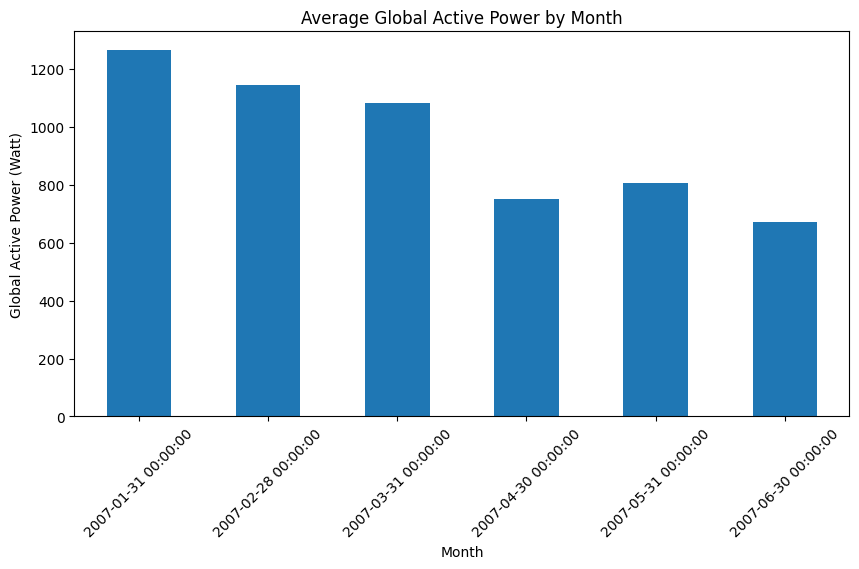

In [18]:
# Plotting the Bar Chart
plt.figure(figsize=(10, 5))
mean_power_by_month.plot(kind='bar')
plt.title('Average Global Active Power by Month')
plt.xlabel('Month')
plt.ylabel('Global Active Power (Watt)')
plt.xticks(rotation=45)
plt.savefig('static/monthly_chart.png')
plt.show()


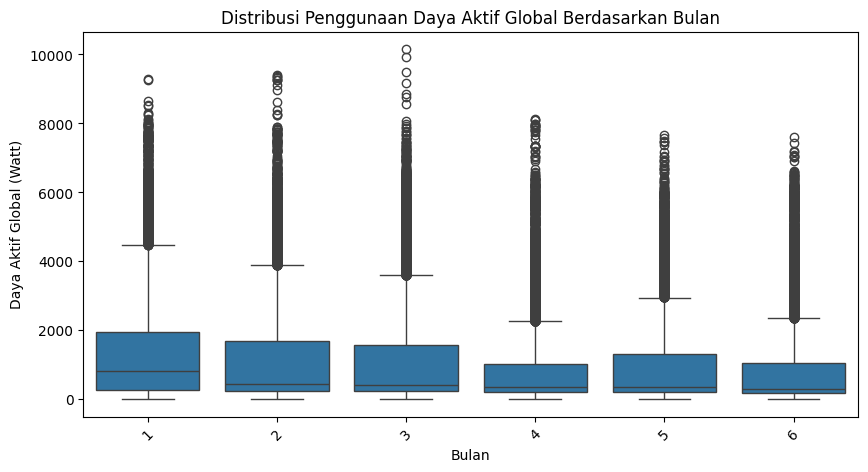

In [19]:
plt.figure(figsize=(10, 5))
sns.boxplot(x=df.index.month, y='Global_active_power (Watt)', data=df)
plt.title('Distribusi Penggunaan Daya Aktif Global Berdasarkan Bulan')
plt.xlabel('Bulan')
plt.ylabel('Daya Aktif Global (Watt)')
plt.xticks(rotation=45)
plt.savefig('static/bloxpot_monthly.png')
plt.show()

Resampling successful.


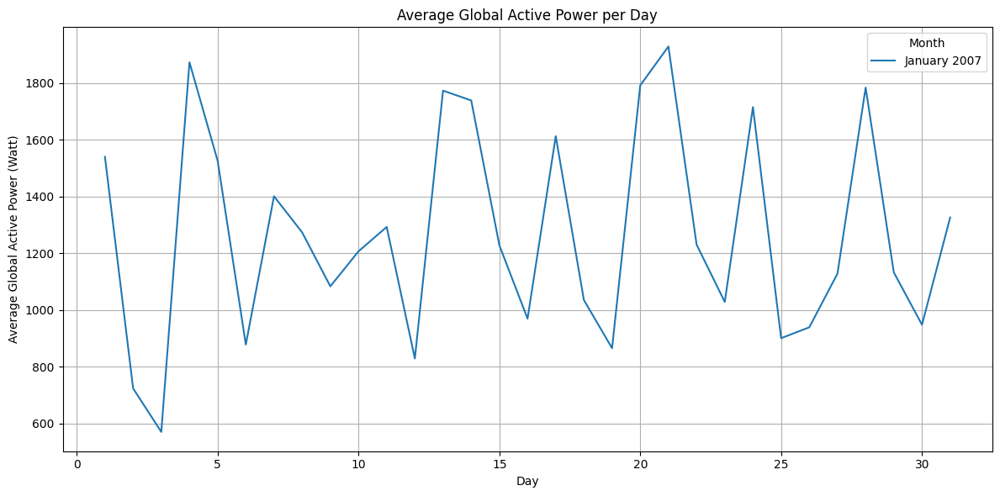

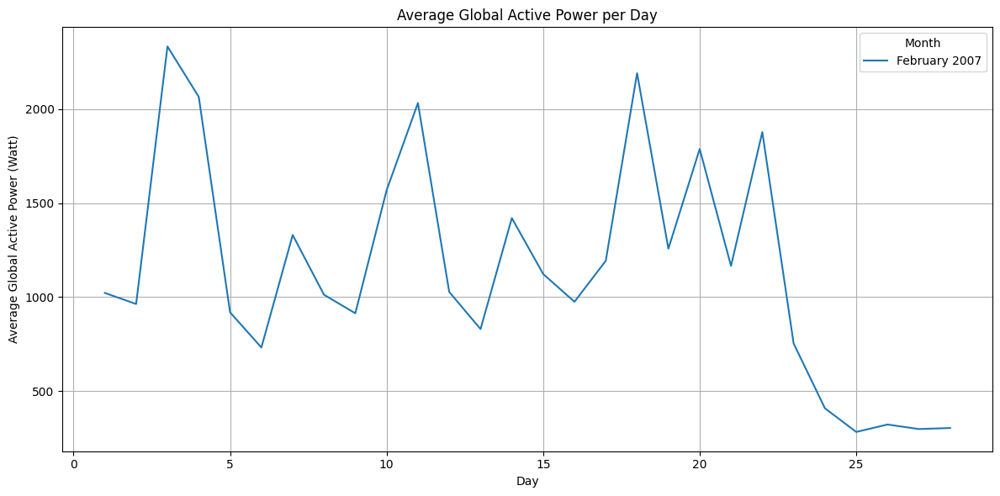

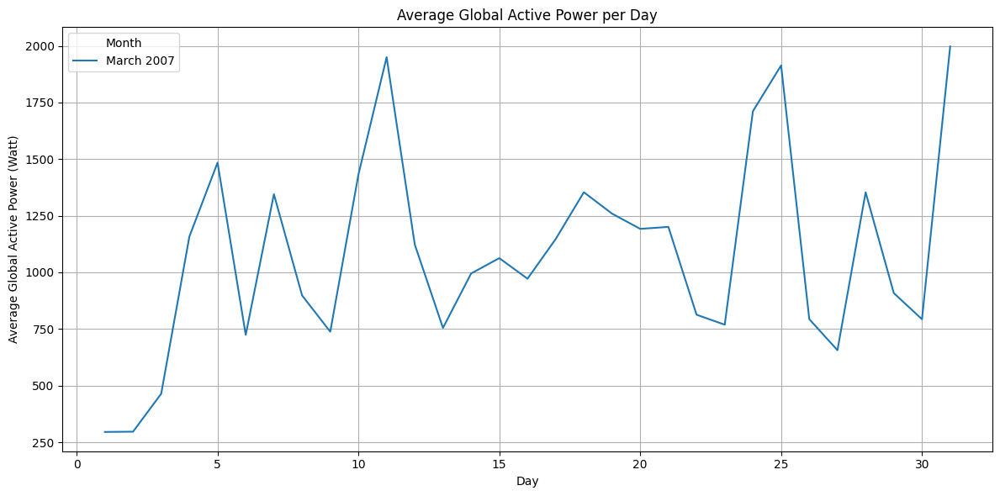

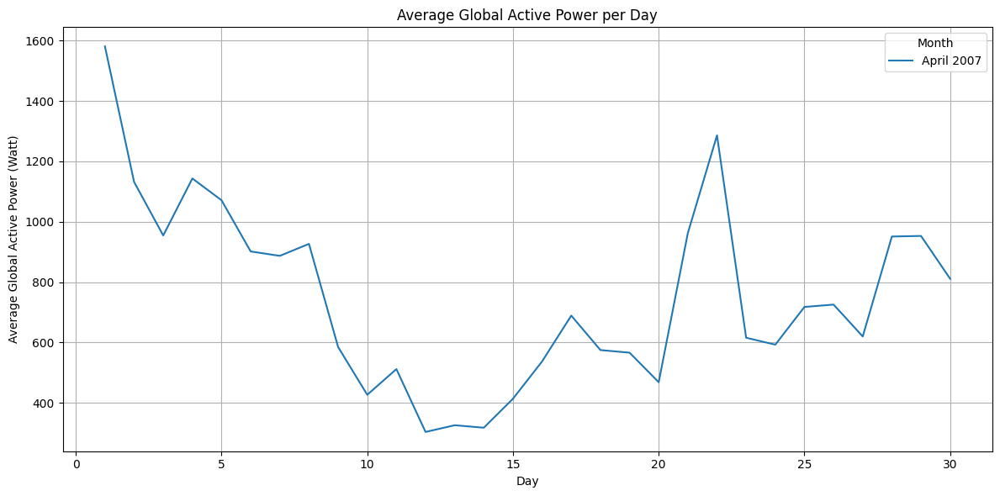

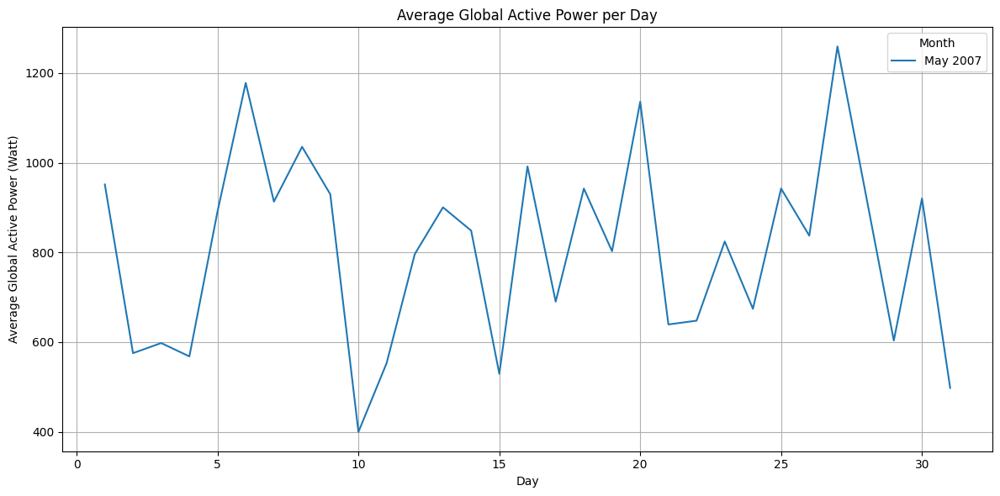

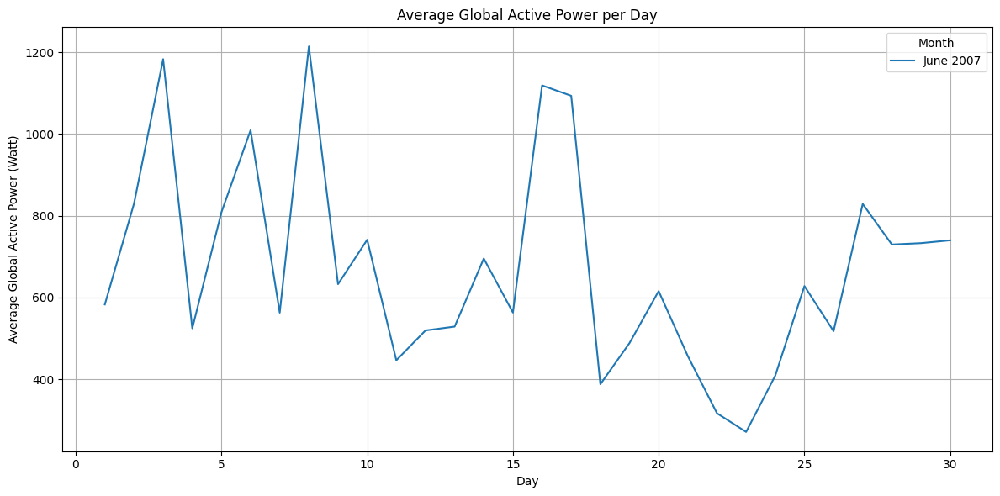

In [20]:
try:
    mean_power_by_day = df.resample('D')['Global_active_power (Watt)'].mean()
    print("Resampling successful.")
except Exception as e:
    print("Error resampling by month:", e)

months = mean_power_by_day.index.to_period('M').unique()

for month in months:
    month_data = mean_power_by_day[month.start_time:month.end_time]
    plt.figure(figsize=(12, 6))
    plt.plot(month_data.index.day, month_data, label=month.strftime('%B %Y'))
    # Create a line chart for the current month
    plt.xlabel('Day')
    plt.ylabel('Average Global Active Power (Watt)')
    plt.title(f'Average Global Active Power per Day')
    plt.grid(True)
    plt.tight_layout()
    plt.legend(title='Month')
    
    file_name = f'static/chart_day_{month.strftime("%Y_%m")}.png'
    plt.savefig(file_name)

    # Show the plot
    plt.show()


#Cek Korelasi

In [21]:
# menghitung korelasi dari setiap pasang variabel pada raw_data
print(df.corr())

# mencari korelasi 'kendall' untuk tiap pasang variabel
print(df.corr(method='kendall'))

# mencari korelasi 'spearman' untuk tiap pasang variabel
print(df.corr(method='spearman'))

                             Global_active_power (Watt)  \
Global_active_power (Watt)                     1.000000   
Global_reactive_power(Kvar)                    0.198231   
Voltage                                       -0.016496   
Global_intensity                               0.724416   

                             Global_reactive_power(Kvar)   Voltage  \
Global_active_power (Watt)                      0.198231 -0.016496   
Global_reactive_power(Kvar)                     1.000000 -0.005387   
Voltage                                        -0.005387  1.000000   
Global_intensity                                0.201339 -0.019358   

                             Global_intensity  
Global_active_power (Watt)           0.724416  
Global_reactive_power(Kvar)          0.201339  
Voltage                             -0.019358  
Global_intensity                     1.000000  
                             Global_active_power (Watt)  \
Global_active_power (Watt)                     1.00000

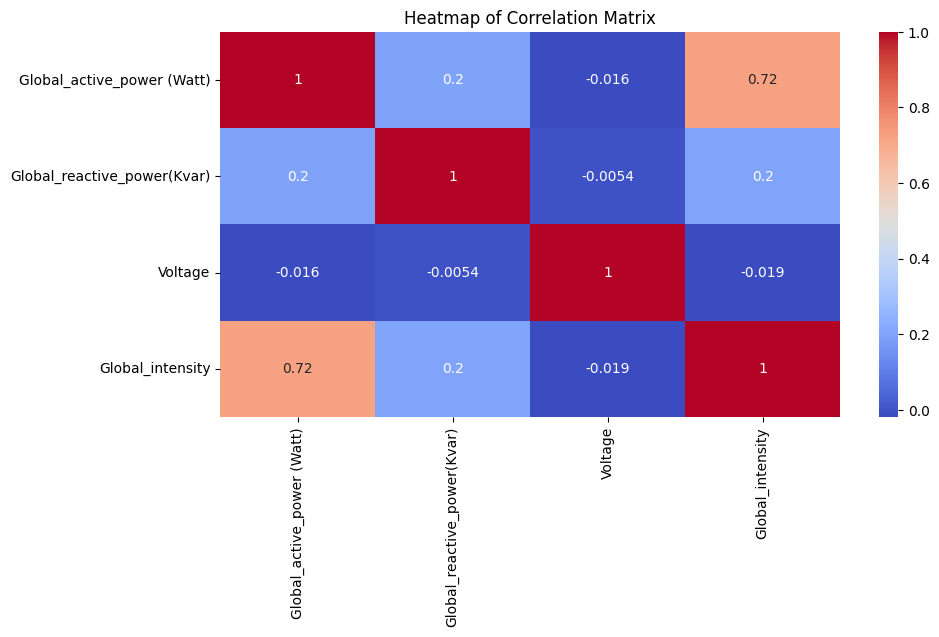

In [22]:
# Compute the correlation matrix
corr = df.corr()

# Cek Korelasi dalam heatmap
plt.figure(figsize=(10, 5))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Heatmap of Correlation Matrix')
plt.show()

#Cek Persebaran Data

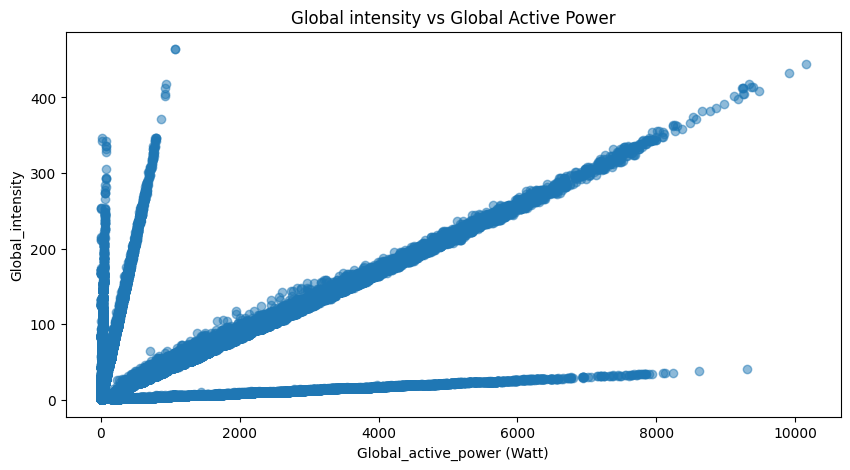

In [23]:
# Plotting the Scatter Plot
plt.figure(figsize=(10, 5))
plt.scatter(df['Global_active_power (Watt)'], df['Global_intensity'], alpha=0.5)
plt.title('Global intensity vs Global Active Power')
plt.xlabel('Global_active_power (Watt)')
plt.ylabel('Global_intensity')
plt.show()

C:\Users\Acer\AppData\Local\Temp\ipykernel_8384\774246830.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  mean_power_by_hour = df.resample('H')['Global_active_power (Watt)'].mean()


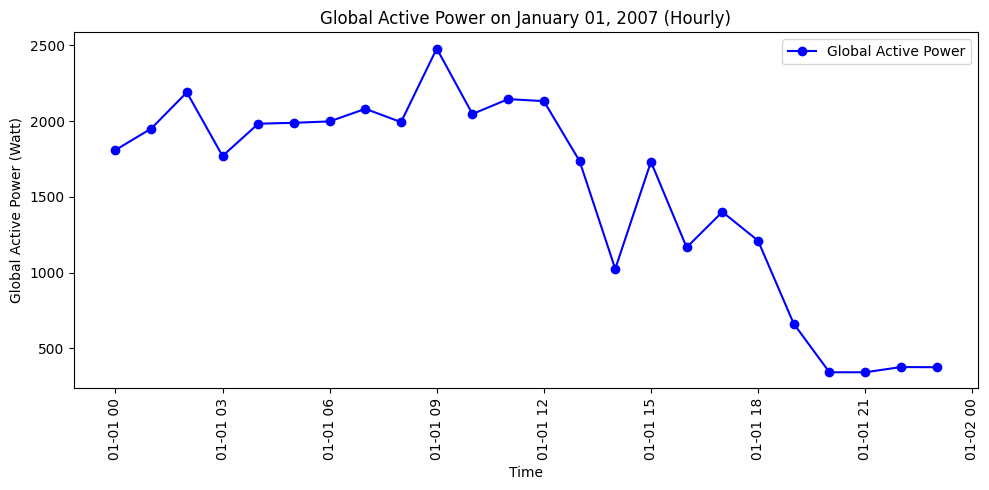

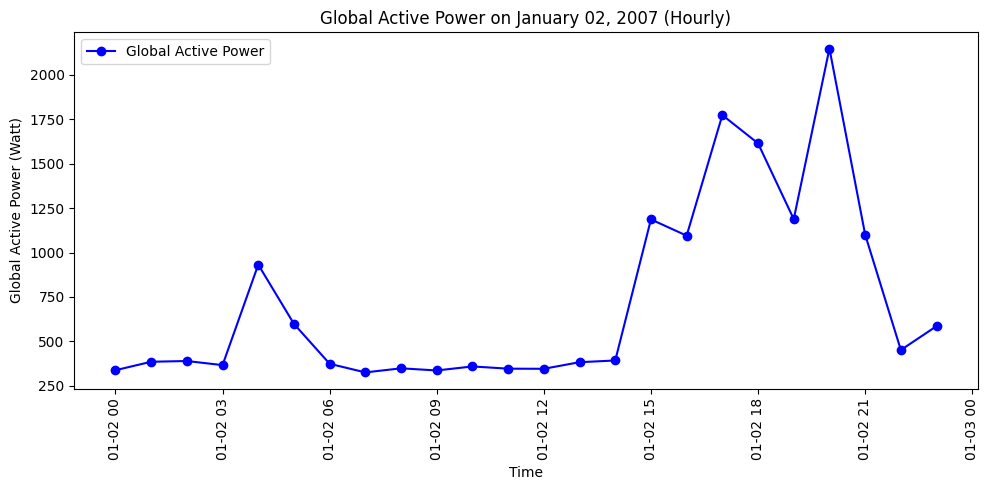

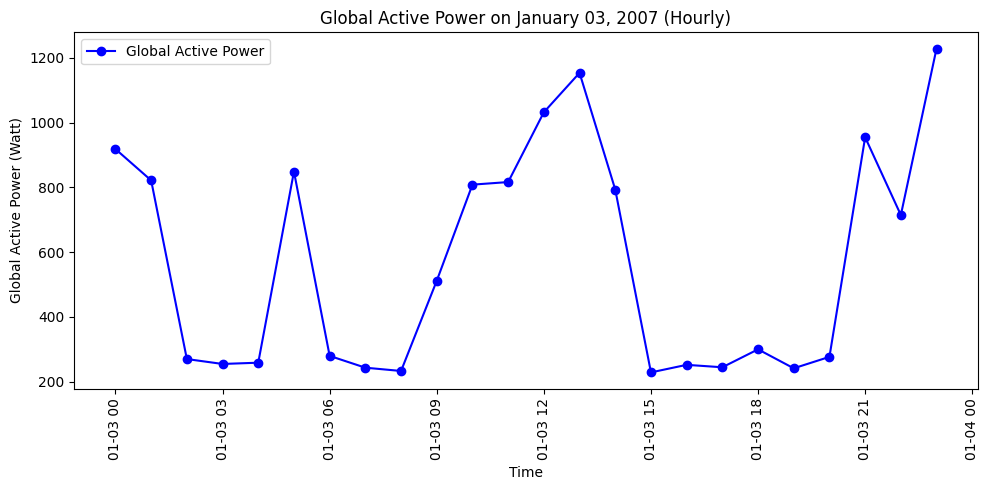

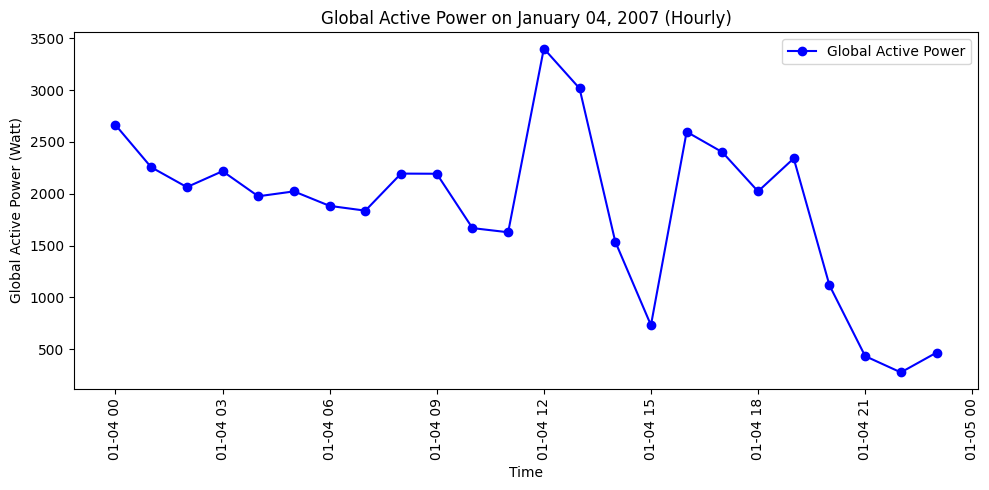

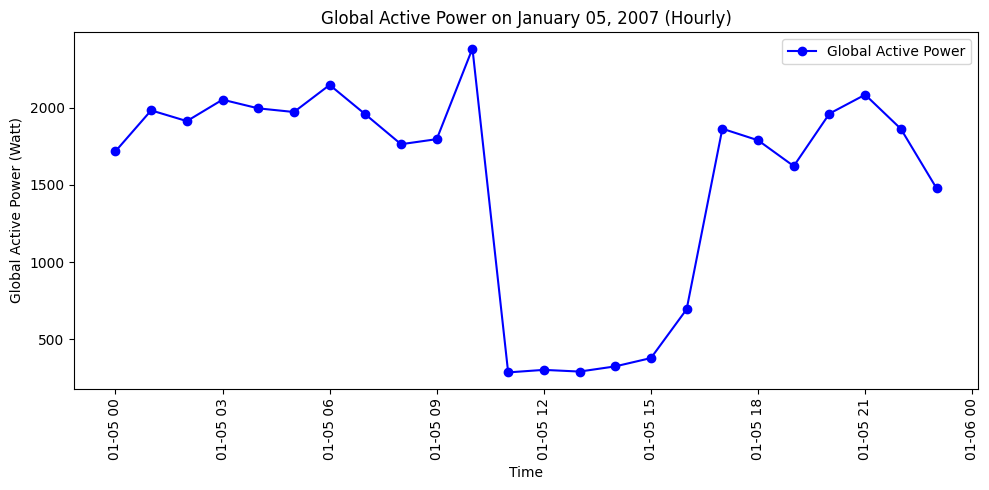

...

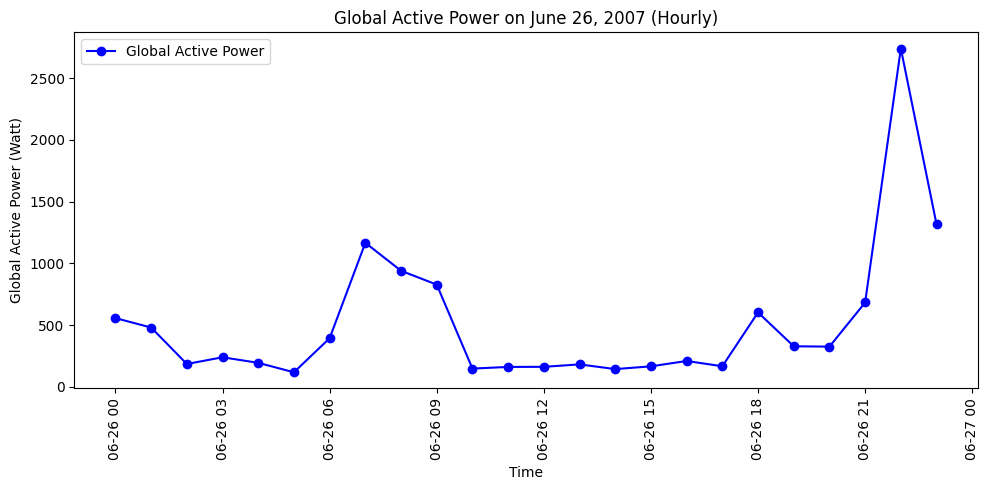

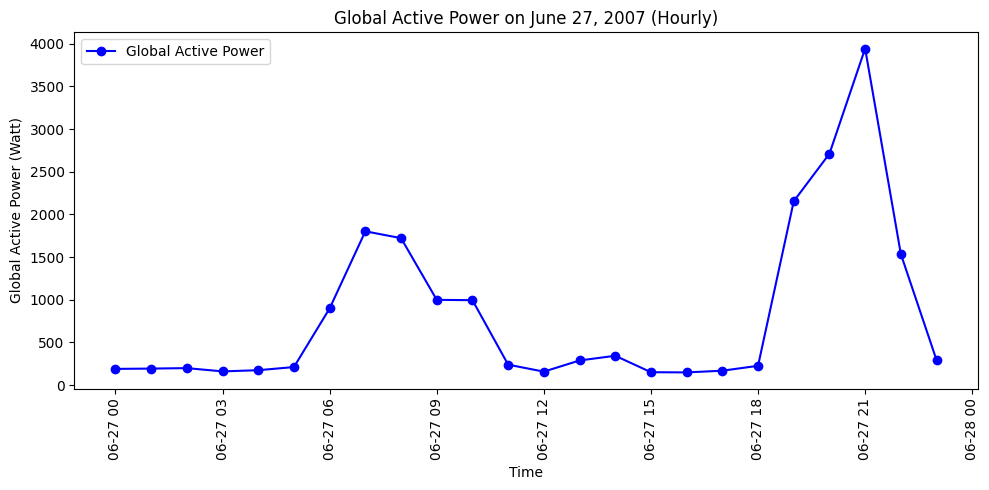

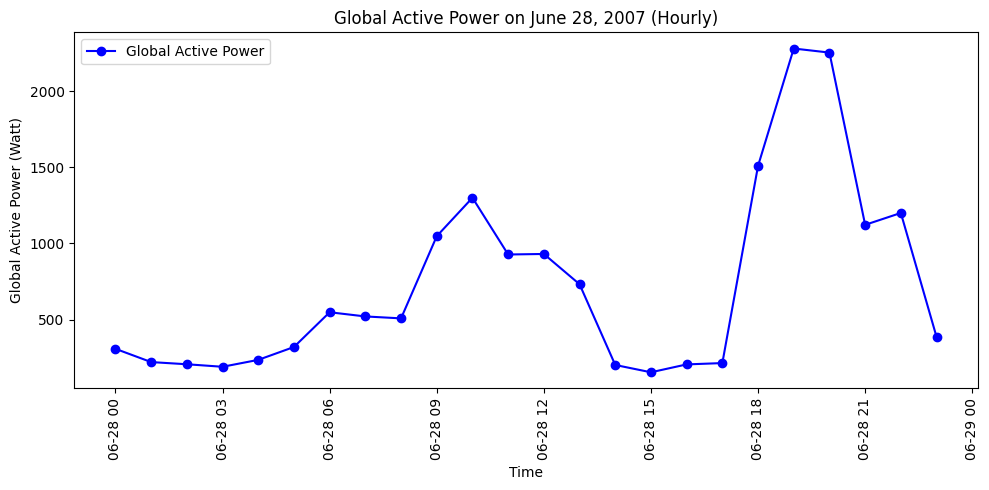

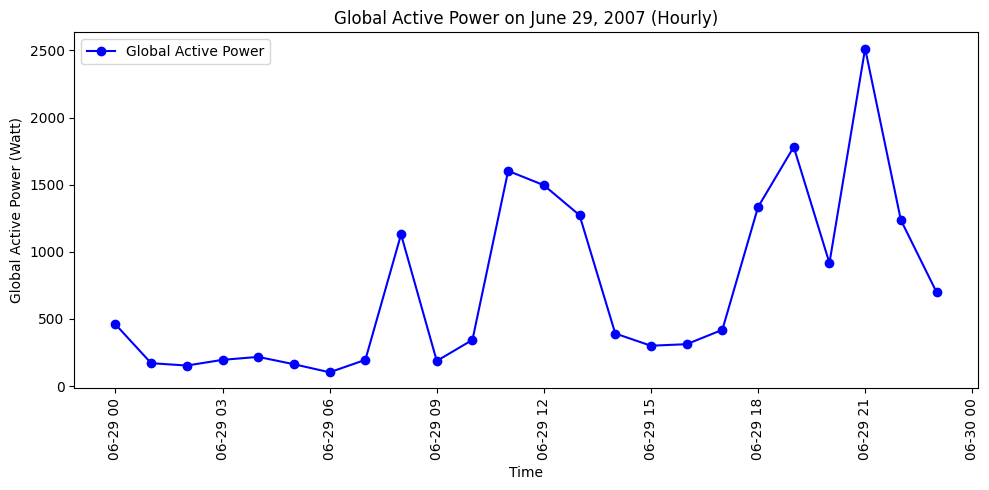

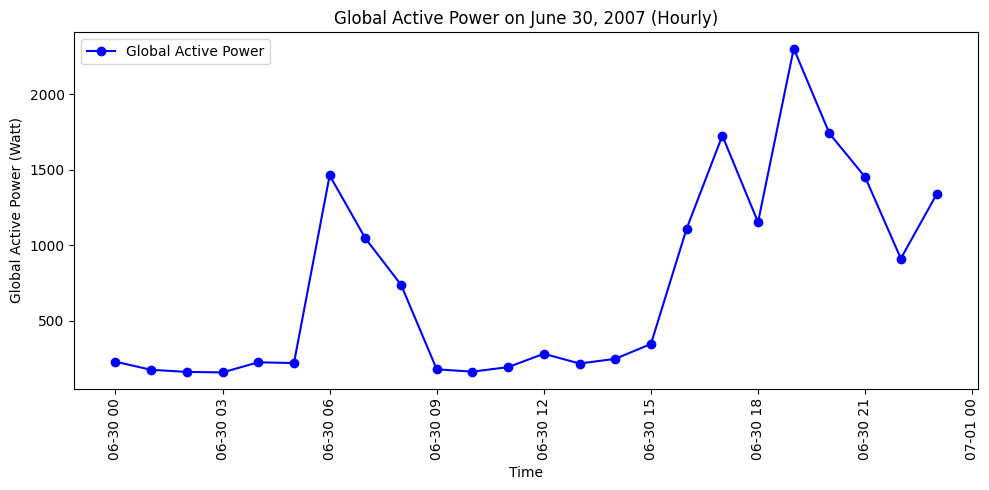

In [24]:
# Resampling data by hour to calculate the mean of 'Global_active_power (Watt)'
mean_power_by_hour = df.resample('H')['Global_active_power (Watt)'].mean()

# Mendapatkan daftar bulan unik
months = mean_power_by_hour.index.to_period('M').unique()

# Loop melalui setiap bulan untuk memfilter data bulanan
for month in months:
    # Filter data untuk bulan tertentu
    monthly_data = mean_power_by_hour[month.start_time:month.end_time]
    # Mendapatkan daftar hari unik dalam bulan tersebut
    days = monthly_data.index.to_period('D').unique()

    for day in days:
        # Filter data untuk hari tertentu
        daily_data = monthly_data[day.start_time:day.end_time]

        # Membuat plot untuk data harian
        plt.figure(figsize=(10, 5))
        plt.plot(daily_data.index, daily_data, marker='o', linestyle='-', color='b', label='Global Active Power')

        plt.title(f'Global Active Power on {day.strftime("%B %d, %Y")} (Hourly)')
        plt.xlabel('Time')
        plt.ylabel('Global Active Power (Watt)')
        plt.xticks(rotation=90)
        plt.legend()

        plt.tight_layout()
        plt.show()

#Prediksi Menggunakan Linear Regression

In [25]:
#simple reggresion
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# menyiapkan data
X = df[['Voltage', 'Global_reactive_power(Kvar)', 'Global_intensity']]
y = df['Global_active_power (Watt)']

# Meegatne train dan test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# linear regression model
model = LinearRegression()

# Train model
model.fit(X_train, y_train)

# prediksi
y_pred = model.predict(X_test)

# Evaluasi model
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)


In [26]:
print('Mean Squared Error:', mse)
print('R-squared:', r2)
print('Mean Absolute Error:', mae)
print('Coefficients:', model.coef_)
print('Intercept:', model.intercept_)

Mean Squared Error: 604943.1836450301
R-squared: 0.5246997728264742
Mean Absolute Error: 453.4912278740667
Coefficients: [-4.24072215e-04  5.69713567e-01  1.68469729e+01]
Intercept: 216.45068643305092


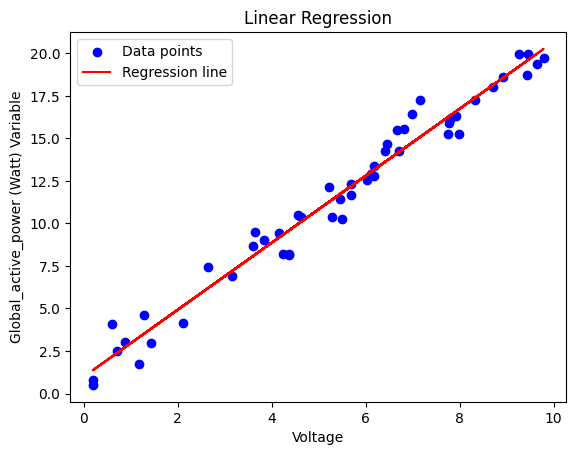

In [27]:
# Membuat sample data
np.random.seed(0)
X_train = np.random.rand(50, 1) * 10  # 2D array (50 samples, 1 feature)
y_train = 2 * X_train[:, 0] + 1 + np.random.randn(50)  #  Global_active_power (Watt) variable

# Fit a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Plotting the scatter plot and the regression line
plt.scatter(X_train[:, 0], y_train, color='blue', label='Data points')
plt.plot(X_train[:, 0], model.coef_[0] * X_train[:, 0] + model.intercept_, 'r', label='Regression line')
plt.xlabel('Voltage')
plt.ylabel('Global_active_power (Watt) Variable')
plt.title('Linear Regression')
plt.legend()
plt.savefig('static/LinearRegression')
plt.show()

#Membuat Data Sample Dalam 1 Hari

In [28]:
np.random.seed(0)
date_range = pd.date_range(start='2023-01-01', end='2023-01-01 23:00', freq='H')  # Satu hari data
data = np.random.rand(len(date_range)) * 1000  # Contoh data daya aktif global
voltage_data = np.random.rand(len(date_range)) * 100 + 100  # Contoh data tegangan
reactive_power_data = np.random.rand(len(date_range)) * 1000  # Contoh data daya reaktif
intensity_data = np.random.rand(len(date_range)) * 10  # Contoh data intensitas

# Membuat DataFrame
sample_df = pd.DataFrame({
    'Global_active_power (Watt)': data,
    'Voltage': voltage_data,
    'Global_reactive_power (Kvar)': reactive_power_data,
    'Global_intensity': intensity_data
}, index=date_range)

# Menyiapkan data untuk regresi linear
X_sample = sample_df[['Voltage', 'Global_reactive_power (Kvar)', 'Global_intensity']]
y_sample = sample_df['Global_active_power (Watt)']

X_train, X_test, y_train, y_test = train_test_split(X_sample, y_sample, test_size=0.2, random_state=0)

C:\Users\Acer\AppData\Local\Temp\ipykernel_8384\2631484949.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  date_range = pd.date_range(start='2023-01-01', end='2023-01-01 23:00', freq='H')  # Satu hari data


#Prediksi Regressi Linear Menggunakan Data Sample




In [29]:
# Fit a linear regression model
model_sample = LinearRegression()
model_sample.fit(X_sample, y_sample)

# Prediksi penggunaan dalam satu hari dengan model yang telah dilatih
y_pred_sample = model_sample.predict(X_sample)

# Prediksi penggunaan terakhir dari data
prediksi_terakhir = y_pred_sample[-1]
print(f'Prediksi penggunaan listrik terakhir: {prediksi_terakhir:.2f} Watt')

# Prediksi penggunaan listrik dalam satu hari
prediksi_harian = np.sum(y_pred_sample)
print(f'Prediksi penggunaan listrik dalam satu hari: {prediksi_harian:.2f} Watt-hour')

# Evaluasi model
mae_sample = mean_absolute_error(y_sample, y_pred_sample)
mse_sample = mean_squared_error(y_sample, y_pred_sample)
r2_sample = r2_score(y_sample, y_pred_sample)

print(f'Mean Squared Error: {mse_sample:.2f}')
print(f'R-squared: {r2_sample:.2f}')
print(f'Mean Absolute Error: {mae_sample: .2f}')
print('Coefficients:', model_sample.coef_)
print('Intercept:', model_sample.intercept_)

Prediksi penggunaan listrik terakhir: 691.60 Watt
Prediksi penggunaan listrik dalam satu hari: 14650.88 Watt-hour
Mean Squared Error: 71255.92
R-squared: 0.03
Mean Absolute Error:  213.99
Coefficients: [-1.68335014e+00  6.62015516e-03 -9.23563845e+00]
Intercept: 895.4585339564615


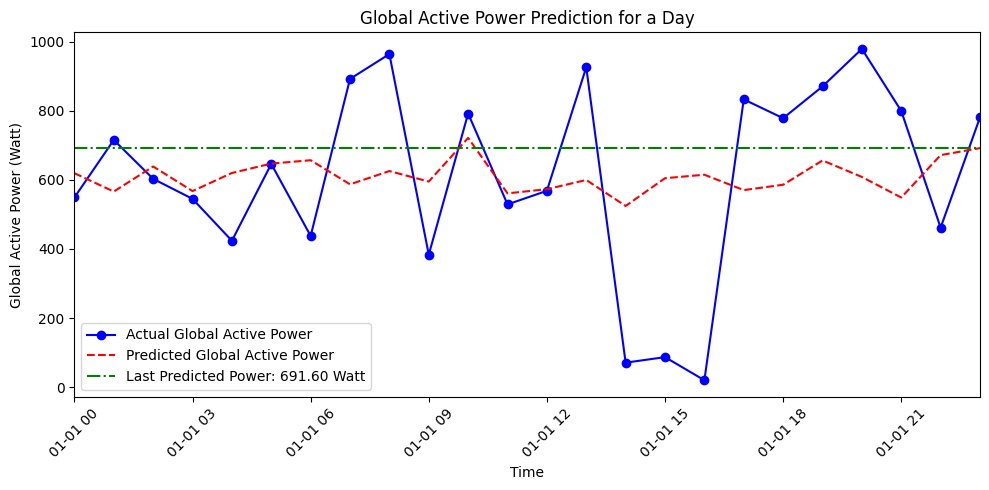

In [30]:
# Membuat plot untuk data sebenarnya dan prediksi
plt.figure(figsize=(10, 5))# Menyesuaikan ukuran figur
plt.plot(sample_df.index, y_sample, marker='o', linestyle='-', color='b', label='Actual Global Active Power')
plt.plot(sample_df.index, y_pred_sample, color='r', linestyle='--', label='Predicted Global Active Power')

# Menandai prediksi terakhir
plt.axhline(y=y_pred_sample[-1], color='g', linestyle='-.', label=f'Last Predicted Power: {y_pred_sample[-1]:.2f} Watt')

plt.title('Global Active Power Prediction for a Day')
plt.xlabel('Time')
plt.ylabel('Global Active Power (Watt)')
plt.xticks(rotation=45)
plt.xlim(sample_df.index[0], sample_df.index[-1])  # Menyesuaikan rentang waktu
plt.legend()

plt.savefig('static/predict_with_sample')
plt.tight_layout()
plt.show()

#Prediksi Menggunakan polynomialFeatures

In [31]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import PolynomialFeatures, StandardScaler

# Normalisasi fitur
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Menggunakan PolynomialFeatures untuk membuat fitur polinomial
poly = PolynomialFeatures(degree=2)  # Adjusted degree for more accurate model
X_train_poly = poly.fit_transform(X_train_scaled)
X_test_poly = poly.transform(X_test_scaled)

# Melatih Model dengan Data Train
model_poly = LinearRegression()
model_poly.fit(X_train_poly, y_train)

# Mengevaluasi Model dengan Data Test
y_pred_poly = model_poly.predict(X_test_poly)

# Evaluasi model
# Evaluasi model
mae_poly = mean_absolute_error(y_test, y_pred_poly)
mse_poly = mean_squared_error(y_test, y_pred_poly)
r2_poly = r2_score(y_test, y_pred_poly)
print(f'Mean Absolute Error (MAE): {mae_poly:.2f}')
print(f'Mean Squared Error (MSE): {mse_poly:.2f}')
print(f'R-squared: {r2_poly:.2f}')
print('Coefficients:', model.coef_)
print('Intercept:', model.intercept_)



Mean Absolute Error (MAE): 587.60
Mean Squared Error (MSE): 580911.83
R-squared: -5.07
Coefficients: [1.96927329]
Intercept: 0.9927899158697198


In [32]:
# Transform the features using PolynomialFeatures
X_sample_scaled = scaler.transform(X_sample)
X_sample_poly = poly.transform(X_sample_scaled)

# Predict the usage for one day with the trained model
y_pred_sample_poly = model_poly.predict(X_sample_poly)

# Predict the last usage from the data
prediksi_terakhir_poly = y_pred_sample_poly[-1]
print(f'Prediksi penggunaan listrik terakhir: {prediksi_terakhir_poly:.2f} Watt')

# Predict the total usage for one day
prediksi_harian_poly = np.sum(y_pred_sample_poly)
print(f'Prediksi penggunaan listrik dalam satu hari: {prediksi_harian_poly:.2f} Watt-hour')


Prediksi penggunaan listrik terakhir: 809.33 Watt
Prediksi penggunaan listrik dalam satu hari: 16466.77 Watt-hour


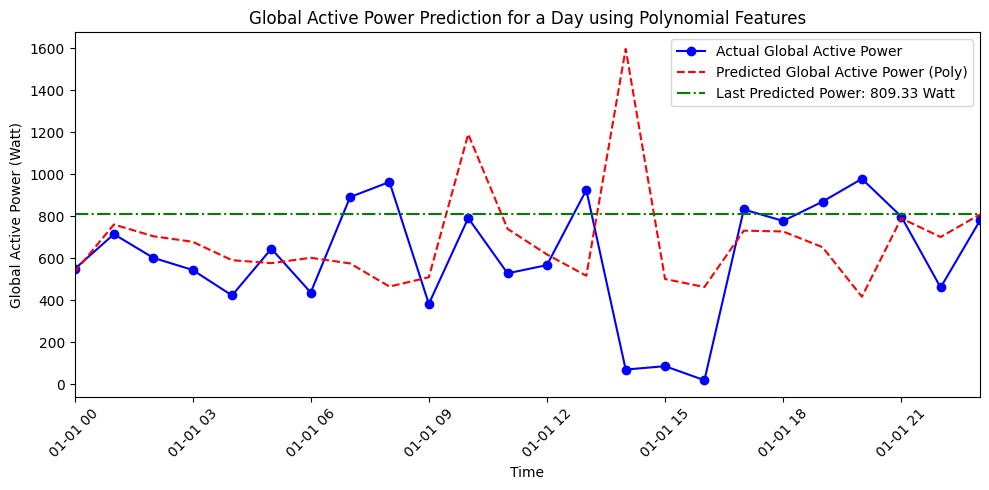

In [33]:
# Plot the actual and predicted data
plt.figure(figsize=(10, 5))# Menyesuaikan ukuran figur
plt.plot(sample_df.index, y_sample, marker='o', linestyle='-', color='b', label='Actual Global Active Power')
plt.plot(sample_df.index, y_pred_sample_poly, color='r', linestyle='--', label='Predicted Global Active Power (Poly)')

# Highlight the last prediction
plt.axhline(y=y_pred_sample_poly[-1], color='g', linestyle='-.', label=f'Last Predicted Power: {y_pred_sample_poly[-1]:.2f} Watt')

plt.title('Global Active Power Prediction for a Day using Polynomial Features')
plt.xlabel('Time')
plt.ylabel('Global Active Power (Watt)')
plt.xticks(rotation=45)
plt.xlim(sample_df.index[0], sample_df.index[-1])  # Adjust the time range
plt.legend()

plt.tight_layout()
plt.savefig('static/predict_with_poly')
plt.show()

#Predikisi Menggunakan RandomForestRegresson

In [34]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score

# Membuat fitur tambahan
sample_df['Hour'] = sample_df.index.hour
sample_df['DayOfWeek'] = sample_df.index.dayofweek

# Menyiapkan data untuk model
X = sample_df[['Voltage', 'Hour', 'DayOfWeek']]
y = sample_df['Global_active_power (Watt)']

# Membagi data menjadi training dan testing set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Membuat dan melatih model Random Forest
model_rf = RandomForestRegressor(n_estimators=100, random_state=0)
model_rf.fit(X_train, y_train)

# Evaluasi model dengan cross-validation
cv_scores = cross_val_score(model_rf, X_train, y_train, cv=5, scoring='r2')
print(f'Cross-Validation R-squared Scores: {cv_scores}')
print(f'Mean Cross-Validation R-squared Score: {cv_scores.mean():.2f}')

# Membuat prediksi
y_pred_train = model_rf.predict(X_train)
y_pred_test = model_rf.predict(X_test)


Cross-Validation R-squared Scores: [ -0.13829793  -2.33294573  -0.7665593  -16.4052509    0.22590039]
Mean Cross-Validation R-squared Score: -3.88


In [35]:
# Evaluasi model
mae_train = mean_absolute_error(y_train, y_pred_train)
mse_train = mean_squared_error(y_train, y_pred_train)
r2_train = r2_score(y_train, y_pred_train)
print(f'Training Mean Absolute Error (MAE): {mae_train:.2f}')
print(f'Training Mean Squared Error (MSE): {mse_train:.2f}')
print(f'Training R-squared: {r2_train:.2f}')
print("")
mae_test = mean_absolute_error(y_test, y_pred_test)
mse_test = mean_squared_error(y_test, y_pred_test)
r2_test = r2_score(y_test, y_pred_test)
print(f'Test Mean Absolute Error (MAE): {mae_test:.2f}')
print(f'Test Mean Squared Error (MSE): {mse_test:.2f}')
print(f'Test R-squared: {r2_test:.2f}')


Training Mean Absolute Error (MAE): 93.00
Training Mean Squared Error (MSE): 13000.26
Training R-squared: 0.80

Test Mean Absolute Error (MAE): 312.11
Test Mean Squared Error (MSE): 129797.88
Test R-squared: -0.29


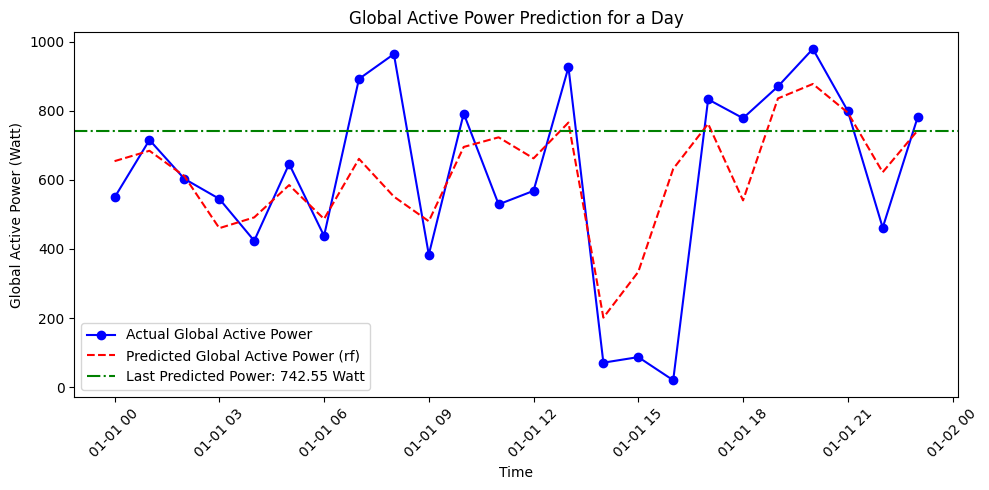

In [36]:
# Membuat plot untuk data sebenarnya dan prediksi
plt.figure(figsize=(10, 5))
plt.plot(sample_df.index, y, marker='o', linestyle='-', color='b', label='Actual Global Active Power')
plt.plot(sample_df.index, model_rf.predict(X), color='r', linestyle='--', label='Predicted Global Active Power (rf)')

# Menandai prediksi terakhir
plt.axhline(y=model_rf.predict(X)[-1], color='g', linestyle='-.', label=f'Last Predicted Power: {model_rf.predict(X)[-1]:.2f} Watt')

plt.title('Global Active Power Prediction for a Day')
plt.xlabel('Time')
plt.ylabel('Global Active Power (Watt)')
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.savefig('static/predict_with_rf')
plt.show()